**Importing Necessary Libraries**

In [ ]:
import tensorflow as tf # for building CNN architecture and training model
from google.colab.patches import cv2_imshow # visualisation
from tensorflow.keras import Model, Sequential, callbacks # for building CNN architecture and training model
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten, Dropout # for building CNN architecture and training model
from tensorflow.keras.losses import SparseCategoricalCrossentropy # to define loss
from tensorflow.keras.optimizers import Adam # to define optimizer
from PIL import Image, ImageOps #Image operations
import numpy as np # matrix manupulation
import pickle # loading saved arrays of training, validation and testing images
import os # file and folder manupulation
import cv2 # open-cv
import re # regex
from sklearn.model_selection import train_test_split

**Building the CNN Architecture**

In [ ]:
license = Sequential() # sequential model

# ading convoution and maxpool layers
license.add(Conv2D(64, 3, padding='same', activation='relu', input_shape=(50,100,3)))
license.add(Conv2D(64, 3, padding='same', activation='relu'))
license.add(MaxPool2D((2,2), strides=(2,2), padding='same'))

license.add(Conv2D(128, 3, padding='same', activation='relu'))
license.add(Conv2D(128, 3, padding='same', activation='relu'))
license.add(MaxPool2D((2,2), strides=(1,1), padding='same'))

license.add(Conv2D(256, 3, padding='same', activation='relu'))
license.add(Conv2D(256, 3, padding='same', activation='relu'))
license.add(MaxPool2D((2,2), strides=(2,2), padding='same'))

license.add(Conv2D(512, 3, padding='same', activation='relu'))
license.add(MaxPool2D((2,2), strides=(1,1), padding='same'))
license.add(Conv2D(512, 3, padding='same', activation='relu'))
license.add(MaxPool2D((2,2), strides=(2,2), padding='same'))

license.add(Flatten())

license.add(Dense(1024, activation='relu'))
license.add(Dropout(0.5))
license.add(Dense(2048, activation='relu'))
license.add(Dropout(0.5, name='feature_vector'))

# defining 10 outputs for the 10 characters
output1 = Dense(26, name='first_character', activation='softmax')(license.output)

output2 = Dense(26, name='second_character', activation='softmax')(license.output)

output3 = Dense(10, name='third_character', activation='softmax')(license.output)

output4 = Dense(10, name='fourth_character', activation='softmax')(license.output)

output5 = Dense(26, name='five_character', activation='softmax')(license.output)

output6 = Dense(26, name='six_character', activation='softmax')(license.output)

output7 = Dense(10, name='seven_character', activation='softmax')(license.output)

output8 = Dense(10, name='eight_character', activation='softmax')(license.output)

output9 = Dense(10, name='nine_character', activation='softmax')(license.output)

output10 = Dense(10, name='ten_character', activation='softmax')(license.output)

In [ ]:
# model object
license = Model(inputs = license.input, outputs = [output1, output2, output3, output4, output5, output6, 
                                                   output7, output8, output9, output10])

In [ ]:
# defining losses for all the ten characters
loss1 = SparseCategoricalCrossentropy(from_logits=False)
loss2 = SparseCategoricalCrossentropy(from_logits=False)
loss3 = SparseCategoricalCrossentropy(from_logits=False)
loss4 = SparseCategoricalCrossentropy(from_logits=False)
loss5 = SparseCategoricalCrossentropy(from_logits=False)
loss6 = SparseCategoricalCrossentropy(from_logits=False)
loss7 = SparseCategoricalCrossentropy(from_logits=False)
loss8 = SparseCategoricalCrossentropy(from_logits=False)
loss9 = SparseCategoricalCrossentropy(from_logits=False)
loss10 = SparseCategoricalCrossentropy(from_logits=False)

In [ ]:
# creating a dictionary of losses to use while compiling the model
losses = {'first_character': loss1, 'second_character': loss2, 'third_character': loss3, 
          'fourth_character':loss4, 'five_character':loss5, 'six_character':loss6,
          'seven_character':loss7, 'eight_character':loss8, 'nine_character':loss9, 'ten_character':loss10}

In [ ]:
metrics = ['accuracy'] # metrics used is accuracy

In [ ]:
# compilation of the model using previously defined losses, optimiser as adam and metrics
license.compile(loss=losses, optimizer='adam', metrics=metrics)

In [ ]:
# loading the x_train array, x_train_label, x_val array and x_val label
# Pickling is convenient as the dataset containing numpy arrays is saved as a pickle file and can be loaded whenever necessary
 
dbfile = open('/content/drive/MyDrive/Forensics/licensePlates/pickle_files/x_train.pkl', 'rb')     
x_train = pickle.load(dbfile)
dbfile.close()
dbfile = open('/content/drive/MyDrive/Forensics/licensePlates/pickle_files/x_val.pkl', 'rb')     
x_val = pickle.load(dbfile)
dbfile.close()
dbfile = open('/content/drive/MyDrive/Forensics/licensePlates/pickle_files/x_train_label.pkl', 'rb')     
label_dict = pickle.load(dbfile)
dbfile.close()
dbfile = open('/content/drive/MyDrive/Forensics/licensePlates/pickle_files/x_val_label.pkl', 'rb')     
label_val = pickle.load(dbfile)
dbfile.close()

In [ ]:
len(label_dict['eight_character'])

85800

In [ ]:
label_dict

{'eight_character': array([6, 6, 6, ..., 6, 6, 6], dtype=int32),
 'first_character': array([6, 6, 6, ..., 6, 6, 6], dtype=int32),
 'five_character': array([ 0,  0,  0, ..., 25, 25, 25], dtype=int32),
 'fourth_character': array([1, 1, 1, ..., 3, 3, 3], dtype=int32),
 'nine_character': array([1, 1, 1, ..., 3, 3, 3], dtype=int32),
 'second_character': array([21, 21, 21, ..., 21, 21, 21], dtype=int32),
 'seven_character': array([5, 5, 5, ..., 3, 3, 3], dtype=int32),
 'six_character': array([ 0,  0,  0, ..., 22, 22, 22], dtype=int32),
 'ten_character': array([5, 5, 5, ..., 4, 4, 4], dtype=int32),
 'third_character': array([0, 0, 0, ..., 3, 3, 3], dtype=int32)}

In [ ]:
y_dict_test

In [ ]:
y_dict_test={}

In [ ]:
y_dict_test['eight_character']=y[742:,7]
y_dict_test['first_character']=y[742:,0]
y_dict_test['five_character']=y[742:,4]
y_dict_test['fourth_character']=y[742:,3]
y_dict_test['nine_character']=y[742:,8]
y_dict_test['second_character']=y[742:,1]
y_dict_test['seven_character']=y[742:,6]
y_dict_test['six_character']=y[742:,5]
y_dict_test['ten_character']=y[742:,9]
y_dict_test['third_character']=y[742:,2]

In [ ]:
y_dict_train={}

In [ ]:
y_dict_train['eight_character']=y[:741,7]
y_dict_train['first_character']=y[:741,0]
y_dict_train['five_character']=y[:741,4]
y_dict_train['fourth_character']=y[:741,3]
y_dict_train['nine_character']=y[:741,8]
y_dict_train['second_character']=y[:741,1]
y_dict_train['seven_character']=y[:741,6]
y_dict_train['six_character']=y[:741,5]
y_dict_train['ten_character']=y[:741,9]
y_dict_train['third_character']=y[:741,2]

In [ ]:
len(x_train)

85800

In [ ]:
x=np.array(image_list)

In [ ]:
max=0
ind=0
for i in range(len(file_names)):
  if max<len(file_names[i]):
    max=len(file_names[i])
    ind=i
print(ind)
file_names[1]

1


'HR26BG0383.png'

In [ ]:
y=np.zeros([len(file_names),10],dtype='int32')
for i in range(len(file_names)):
  for j in range(len(file_names[i])-4):
    if(file_names[i][j].isdigit()):
      y[i][j]=ord(file_names[i][j])-22
    else:
      y[i][j]=ord(file_names[i][j])-65


In [ ]:
x_train.shape

(85800, 50, 100, 3)

In [ ]:
x[4].shape

(78, 283, 3)

In [ ]:
x_train=x[:741]
x_val=x[742:]

In [ ]:
len(label_dict)

10

In [ ]:
for k,v in label_dict.items():
  print(v)

[6 6 6 ... 6 6 6]
[21 21 21 ... 21 21 21]
[0 0 0 ... 3 3 3]
[1 1 1 ... 3 3 3]
[ 0  0  0 ... 25 25 25]
[ 0  0  0 ... 22 22 22]
[5 5 5 ... 3 3 3]
[6 6 6 ... 6 6 6]
[1 1 1 ... 3 3 3]
[5 5 5 ... 4 4 4]


In [ ]:
for i in range(len(x_train)):
  cv2_imshow(x_train[i])


In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
# defining callbacks to save the model with the minimum validation loss

filepath = '/content/drive/MyDrive/licensePlates'
callback = callbacks.ModelCheckpoint(filepath=filepath,monitor='val_loss',
                                     mode='min',save_best_only=True)

In [ ]:
# fitting the model, make sure to train on GPU.
# batch size of 512 is used, and since the total number of training images were around 85,000, steps per epoch is 168

license.fit(x_train, y=y_dict_train, validation_data=(x_val,y_dict_test), 
            epochs=1500, batch_size=512, callbacks=[callback])

Epoch 1/1500
2/2 [==============================] - 52s 18s/step - loss: nan - first_character_loss: nan - second_character_loss: nan - third_character_loss: nan - fourth_character_loss: nan - five_character_loss: nan - six_character_loss: nan - seven_character_loss: nan - eight_character_loss: nan - nine_character_loss: nan - ten_character_loss: nan - first_character_accuracy: 0.0432 - second_character_accuracy: 0.0216 - third_character_accuracy: 0.0013 - fourth_character_accuracy: 0.0081 - five_character_accuracy: 0.1215 - six_character_accuracy: 0.0216 - seven_character_accuracy: 0.0040 - eight_character_accuracy: 0.0040 - nine_character_accuracy: 0.0081 - ten_character_accuracy: 0.1646 - val_loss: nan - val_first_character_loss: nan - val_second_character_loss: nan - val_third_character_loss: nan - val_fourth_character_loss: nan - val_five_character_loss: nan - val_six_character_loss: nan - val_seven_character_loss: nan - val_eight_character_loss: nan - val_nine_character_loss: nan

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
len(x_train)

741

In [ ]:
len(y_dict_train['eight_character'])

741

In [ ]:
# since the 15 epoch model was the best one we can save the model object or use the model saved by the callbacks which is
# again the 15 epoch one
tf.keras.models.save_model(license, '/content/drive/MyDrive/Forensics/licensePlates/model.h5')

In [ ]:
# this way we can load the saved model
license_model = tf.keras.models.load_model('/content/drive/MyDrive/Forensics/licensePlates/model.h5')

In [ ]:
# loading the test dataset which is a pickle file
dbfile = open('/content/drive/MyDrive/licensePlates/x_test.pkl', 'rb')     
x_test = pickle.load(dbfile)
dbfile.close()

In [ ]:
image_list = []
file_names=[]
path='/content/drive/MyDrive/Forensics/in'
for filename in os.listdir(path):
    #print(filename.split('.')[0][-1])
    img = cv2.imread(os.path.join(path,filename))
    if img is not None and filename.split('.')[0][-1]!=')':
        img_=cv2.resize(img,(100,50),interpolation = cv2.INTER_CUBIC)
        image_list.append(img_)
        file_names.append(filename)

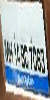

GV17TC6144


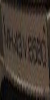

GV06QI8006


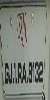

GV33JD9225


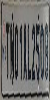

GV01QU2166


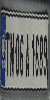

GV03WV6161


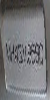

GV03IL9530


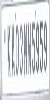

GV11UT5060


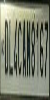

GV08QT6117


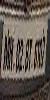

GV03ML8868


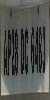

GV01WM2106


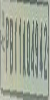

GV03HU2061


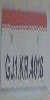

GV07II7070


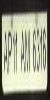

GV03DU4931


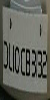

GV07RP9816


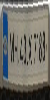

GV03NL8063


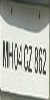

GV09QU6109


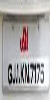

GV32IQ5424


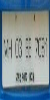

GV33NT8616


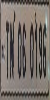

GV13WI7154


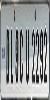

GV11MU2110


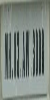

GV09IW2001


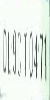

GV01UT2011


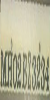

GV29WW7009


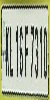

GV11NV2161


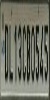

GV11MU2069


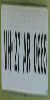

GV03GM7156


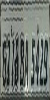

GV06DI9109


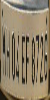

GV03DU9111


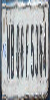

GV03QT6169


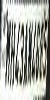

GV13NT4169


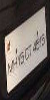

GV02JD9672


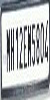

GV03DU6083


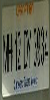

GV05XJ9123


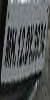

GV02DT3771


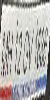

GV25YL9013


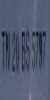

GV19UP2632


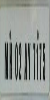

GV21QI7110


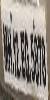

GV13WL8111


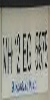

GV09FU9060


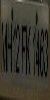

GV01II6106


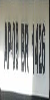

GV01DT4196


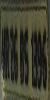

GV03WC8118


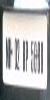

GV03OI5111


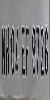

GV06II9046


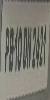

GV09QT7191


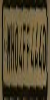

GV11MT2066


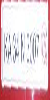

GV03ZV4661


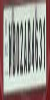

GV11HL2060


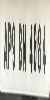

GV01DM2167


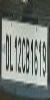

GV11QF5626


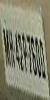

GV05ML2616


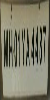

GV03MU4166


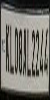

GV08QP5006


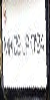

GV03AL9852


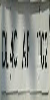

GV17KW2466


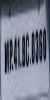

GV05LU1101


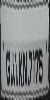

GV19HT5110


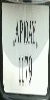

GV04AF1135


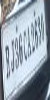

GV01TU9816


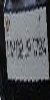

GV05AW9096


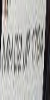

GV15CF2991


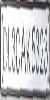

GV03QV9916


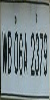

GV01HU9707


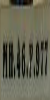

GV21DI6111


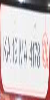

GV03QT4909


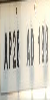

GV03HH9112


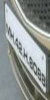

GV08AF3741


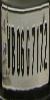

GV03QT2016


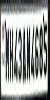

GV03MU4359


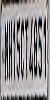

GV12WI4169


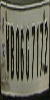

GV01WT2001


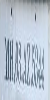

GV29IW9085


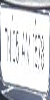

GV03QF2614


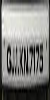

GV19WU6110


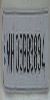

GV06GW2657


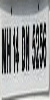

GV29UY9084


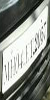

GV02ZJ9276


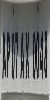

GV03DI2111


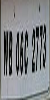

GV11NV2111


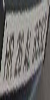

GV03CT7933


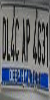

GV24WZ3166


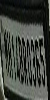

GV02WP2119


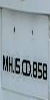

GV12ZC5750


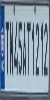

GV11NU7166


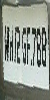

GV02GF7166


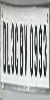

GV01MU2163


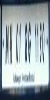

GV03LL4613


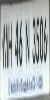

GV01HU8057


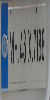

GV13KW7856


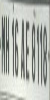

GV21UL6162


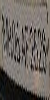

GV27ML2066


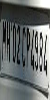

GV19UV9417


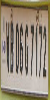

GV03QU2160


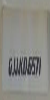

GV11II5171


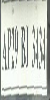

GV03VY7757


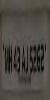

GV09II9110


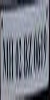

GV05OL8193


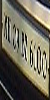

GV09WP9111


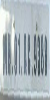

GV01HI6111


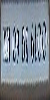

GV10NL3168


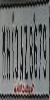

GV03DL9170


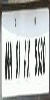

GV02PI8163


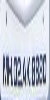

GV05JI2700


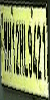

GV33MT8951


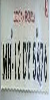

GV09HT2111


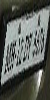

GV03IZ9970


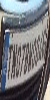

GV07FJ3621


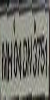

GV23CF9165


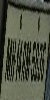

GV03RL9160


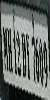

GV09IM6108


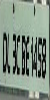

GV03QI2665


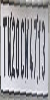

GV13HT2767


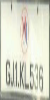

GV03JU6111


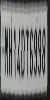

GV13QL2119


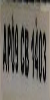

GV21HI2114


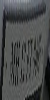

GV13PT9161


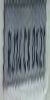

GV19IW2116


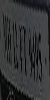

GV09BW4110


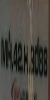

GV03JP8611


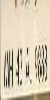

GV09PI1141


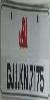

GV31BO5125


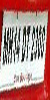

GV01LL2119


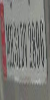

GV03ML9767


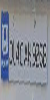

GV19WW9166


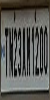

GV03QU2616


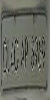

GV09EW9706


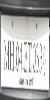

GV01JU5169


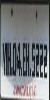

GV03II9709


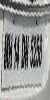

GV20FW2033


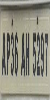

GV02HI5005


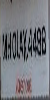

GV02II1956


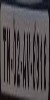

GV03WU2116


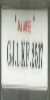

GV00JL3960


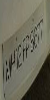

GV09AU7230


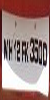

GV01DF2966


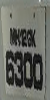

GV06II9170


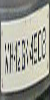

GV03GU3154


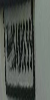

GV33LT7620


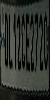

GV02QP9066


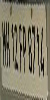

GV13NL2151


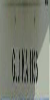

GV13CI1120


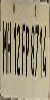

GV01HH2059


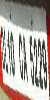

GV15OL4461


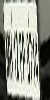

GV20DP2706


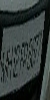

GV02HU2271


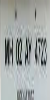

GV02LV7157


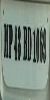

GV11HT5161


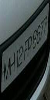

GV07JI5776


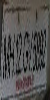

GV04VL9138


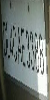

GV03II9661


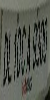

GV11UT2627


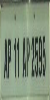

GV03EI6113


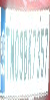

GV29AU7151


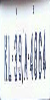

GV02HU2111


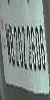

GV03UL4150


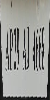

GV03QL3113


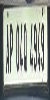

GV03WL2161


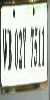

GV10RI2091


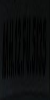

GV02WW2126


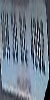

GV33WT9076


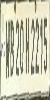

GV14HT2162


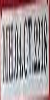

GV02HU5152


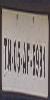

GV03QL6161


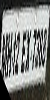

GV05NU2066


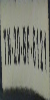

GV31WI7166


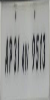

GV18QI2104


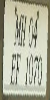

GV03IP4110


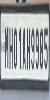

GV02MT9991


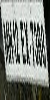

GV30MT9168


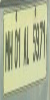

GV01LU6993


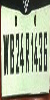

GV01DT2911


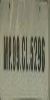

GV05JI2111


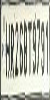

GV03JT2170


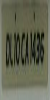

GV10MW3190


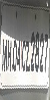

GV05MI2766


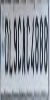

GV13IU2164


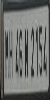

GV02NU2164


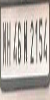

GV03MU3023


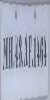

GV13QU2013


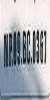

GV18IW2092


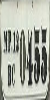

GV09WT7101


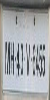

GV09QY4161


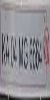

GV09DU9078


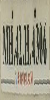

GV24HU8037


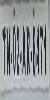

GV01HT7107


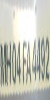

GV00JC9180


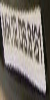

GV21QT1526


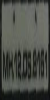

GV01QF9100


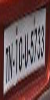

GV13UU9115


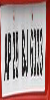

GV03UL4111


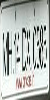

GV01QL7961


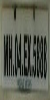

GV21II9069


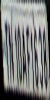

GV11DV4111


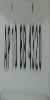

GV31UU7032


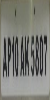

GV29II2026


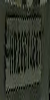

GV01IW2116


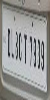

GV13IL5112


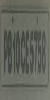

GV05II2151


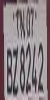

GV03OU8161


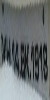

GV26HU4116


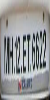

GV03WF8889


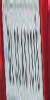

GV17PW9139


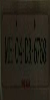

GV02WC2116


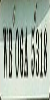

GV11FU6151


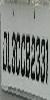

GV07JV6312


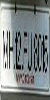

GV09IP9026


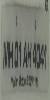

GV00BI1020


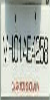

GV20ZV5056


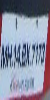

GV03AU7120


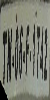

GV11HU5122


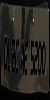

GV33QL9156


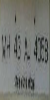

GV04LV6953


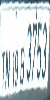

GV05DU8161


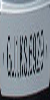

GV15DT5054


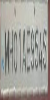

GV03CL4161


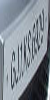

GV01JW1220


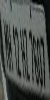

GV19WL8018


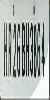

GV03DU1116


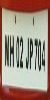

GV03QL9166


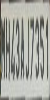

GV13MJ6115


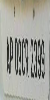

GV29JV2671


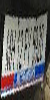

GV17DU9979


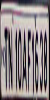

GV02WV9096


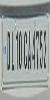

GV03FU9997


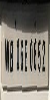

GV09DM2170


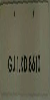

GV14II5176


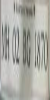

GV29MU9933


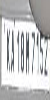

GV12HW2183


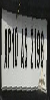

GV01HT8051


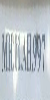

GV29HH2013


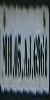

GV12QI5166


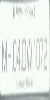

GV14IH5799


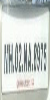

GV09QI6000


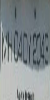

GV28JC8017


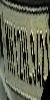

GV06WC6100


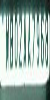

GV02MU5076


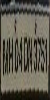

GV03QI9061


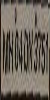

GV24QP9006


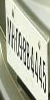

GV02MU9410


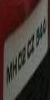

GV07JO3870


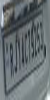

GV03FU2251


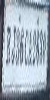

GV13UT1056


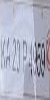

GV03JG6100


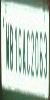

GV02DT2161


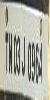

GV24PI5111


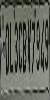

GV12WV9066


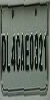

GV16UU9116


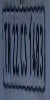

GV13OU2115


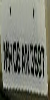

GV15QT6961


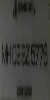

GV04II8016


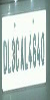

GV02JL4051


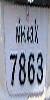

GV30IY7653


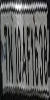

GV13OZ9613


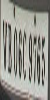

GV05HT6111


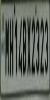

GV13HU2067


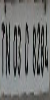

GV04MT5067


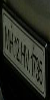

GV16NP8676


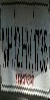

GV11WW9005


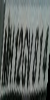

GV21WW8006


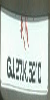

GV03RT6111


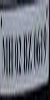

GV03UU5166


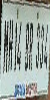

GV03PU2721


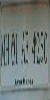

GV08LL9953


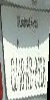

GV07EL9111


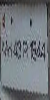

GV01JI6168


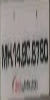

GV19II9423


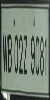

GV12DL7161


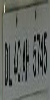

GV29HY9116


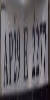

GV04MU1161


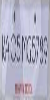

GV10ZV9096


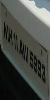

GV06WP9826


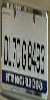

GV03GL3116


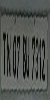

GV03MM2016


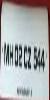

GV15II1119


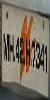

GV05AP2455


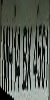

GV09MM9726


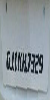

GV11DP5170


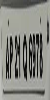

GV15UI9111


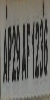

GV01UF1167


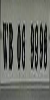

GV11UP2731


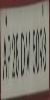

GV08WT2106


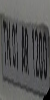

GV21QZ7122


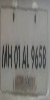

GV11GI8174


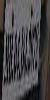

GV23WU9161


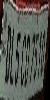

GV01WC9180


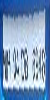

GV13ZF4169


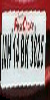

GV13HU2068


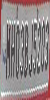

GV11MI2161


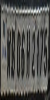

GV02HM2066


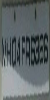

GV03MP2916


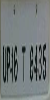

GV09II7169


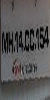

GV09IS3222


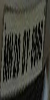

GV05PW9111


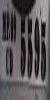

GV03ML7166


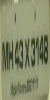

GV10MP9020


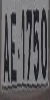

GV13QF2166


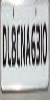

GV01UW2001


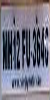

GV01WR9836


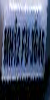

GV01NG9014


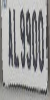

GV13MT9055


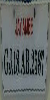

GV29BV9121


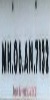

GV01JH2166


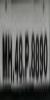

GV00HW2046


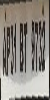

GV01OT1176


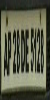

GV09RT2013


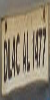

GV05KL1118


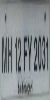

GV09II8099


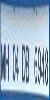

GV05PT9061


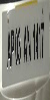

GV01BU2163


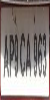

GV08WT6107


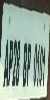

GV09JL6161


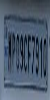

GV02MI2760


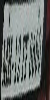

GV21PM9636


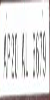

GV05DH6103


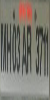

GV11KH9174


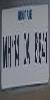

GV03TV8083


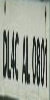

GV05FW1194


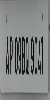

GV09BU7516


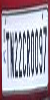

GV03QL2119


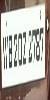

GV33BT9637


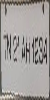

GV02JU3196


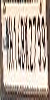

GV23WL8168


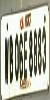

GV05MI9665


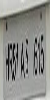

GV08IY9110


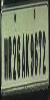

GV31QL9101


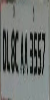

GV09IM2116


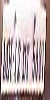

GV33DT9150


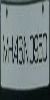

GV05HF2066


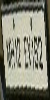

GV11OI9060


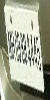

GV27DC2860


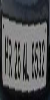

GV01CU8161


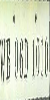

GV01PV6119


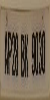

GV05KX2115


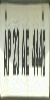

GV05QV6117


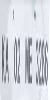

GV06EF4135


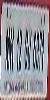

GV09UT1111


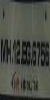

GV02II9821


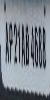

GV11UU2062


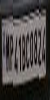

GV01BF9820


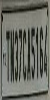

GV01BU2169


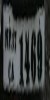

GV03HU2011


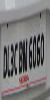

GV02IM4650


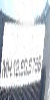

GV01JU1151


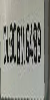

GV01UT9951


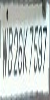

GV01NT2011


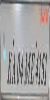

GV19RT5100


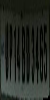

GV03HM2116


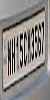

GV04FC9953


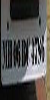

GV23BF3698


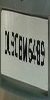

GV05IL9168


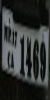

GV03QU2068


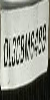

GV02KL8118


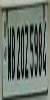

GV14IW2160


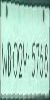

GV04WL7176


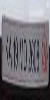

GV26IP9020


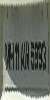

GV02QV9466


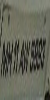

GV21IY9128


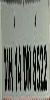

GV20II9118


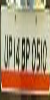

GV14MW2112


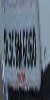

GV06MW9066


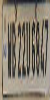

GV11WL2160


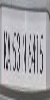

GV03DP2067


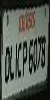

GV03OL4069


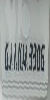

GV09WT4110


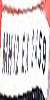

GV03RC2161


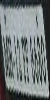

GV23HV8610


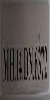

GV03ID8110


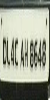

GV02WC8166


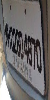

GV06QI6126


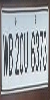

GV05WT9168


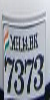

GV05ZS7700


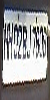

GV14HT9762


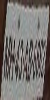

GV03IT9078


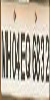

GV24BL6010


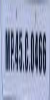

GV08HV2083


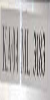

GV09HW7161


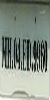

GV28MI5193


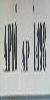

GV06QW2190


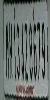

GV14OL2516


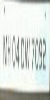

GV26QH5185


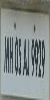

GV15DW5163


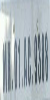

GV20MH6016


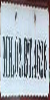

GV01OL7119


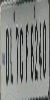

GV11QT2766


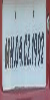

GV10UL8151


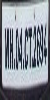

GV03DU2163


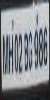

GV09QW5082


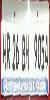

GV05WF8119


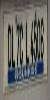

GV11HU9171


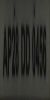

GV21IW2156


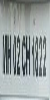

GV05II7116


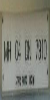

GV14CF9965


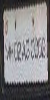

GV03JU8626


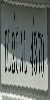

GV02WL4014


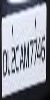

GV03AU2155


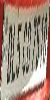

GV03KT4651


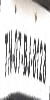

GV04IQ2704


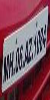

GV02SU2475


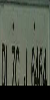

GV23MU5959


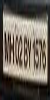

GV29WL9108


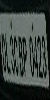

GV03MU9116


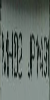

GV06IG9116


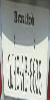

GV25PU9111


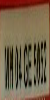

GV29WI6109


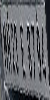

GV33HL5117


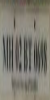

GV20QI8091


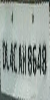

GV21JW9161


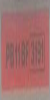

GV13II3135


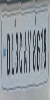

GV01PU1997


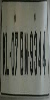

GV01HI2116


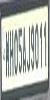

GV03MT9961


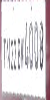

GV13QT9069


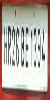

GV33QL3116


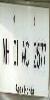

GV03OU6063


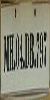

GV25UT5061


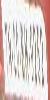

GV13WT2111


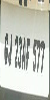

GV18JI2056


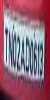

GV03IL9114


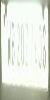

GV02AU3661


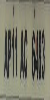

GV04IW7110


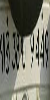

GV03DV5770


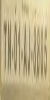

GV11UU5067


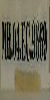

GV12VF9155


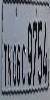

GV09FU5720


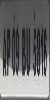

GV01HI2116


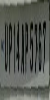

GV11QU2013


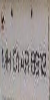

GV11JU5165


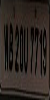

GV01QI2156


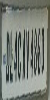

GV13WT4111


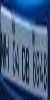

GV03WP2611


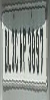

GV01DT3627


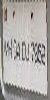

GV10JT9546


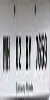

GV22LH9053


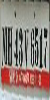

GV10WU2796


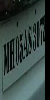

GV02TU9520


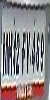

GV03FU9151


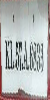

GV03JL1159


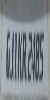

GV04HW2011


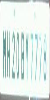

GV06AH2093


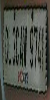

GV01UL9035


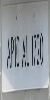

GV09DP2163


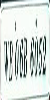

GV29OI2176


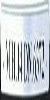

GV20HT2110


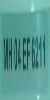

GV09CI7196


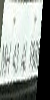

GV06OW4164


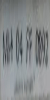

GV10TU7157


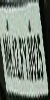

GV11DT9170


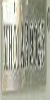

GV11WL2748


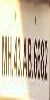

GV03DJ9114


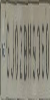

GV03HU6167


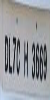

GV06CI7165


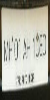

GV05TU4641


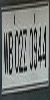

GV06QL6961


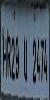

GV06OY9161


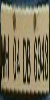

GV01WF9826


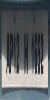

GV05QU8111


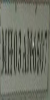

GV06IH9064


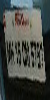

GV04QV9666


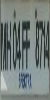

GV14JT4069


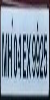

GV09WI2115


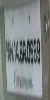

GV25IW4146


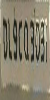

GV01HU9764


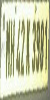

GV01HT2164


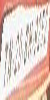

GV03ZT4657


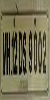

GV07WI2063


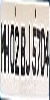

GV01HT2111


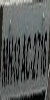

GV05DU5110


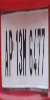

GV03ML8612


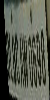

GV13WL2119


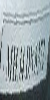

GV04IT9110


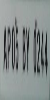

GV21QI2166


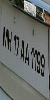

GV06QI3116


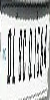

GV14QT2161


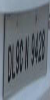

GV12HW2097


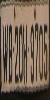

GV33BT8069


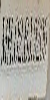

GV03LU3169


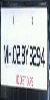

GV05JF9169


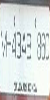

GV27EP9036


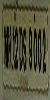

GV01WU5105


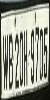

GV30QT2700


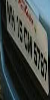

GV07IK9968


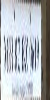

GV07PC9186


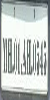

GV09DU6160


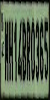

GV21QI9576


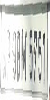

GV06MI1169


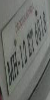

GV03QW3990


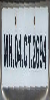

GV03QU9166


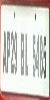

GV05QL2110


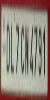

GV11HT7110


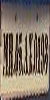

GV04HP5061


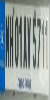

GV11IL9022


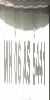

GV25WI4105


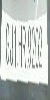

GV11UU8949


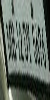

GV11UL9068


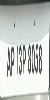

GV29QT9110


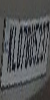

GV01UU2126


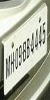

GV01JL1346


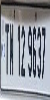

GV11IM5116


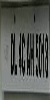

GV13DI7119


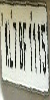

GV01DT7020


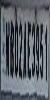

GV11IH2176


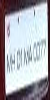

GV12JL1435


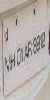

GV09MI1636


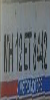

GV08MW9042


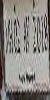

GV14NJ8064


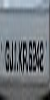

GV11IU9136


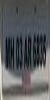

GV23IW9083


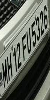

GV05QZ9262


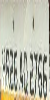

GV09DD9000


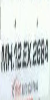

GV09JM9099


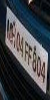

GV06VP4140


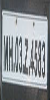

GV03QL8150


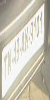

GV02TL5116


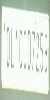

GV05JI3111


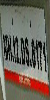

GV02WT6039


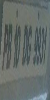

GV19KH2057


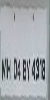

GV05BL2101


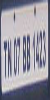

GV33BU4169


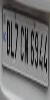

GV19QP2006


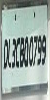

GV11AC9145


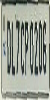

GV13OU6170


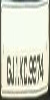

GV05QU8111


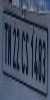

GV09IW2116


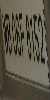

GV01QP9626


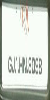

GV05HT6111


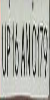

GV09HU7101


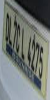

GV11IW3414


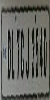

GV17WT2168


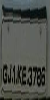

GV03IL9225


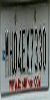

GV21QU2013


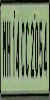

GV13DU2767


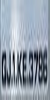

GV09HW8189


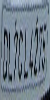

GV11HI5112


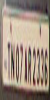

GV09JC6111


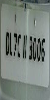

GV13UW9837


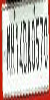

GV02UL9163


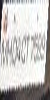

GV03JU2152


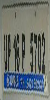

GV03DP2011


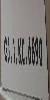

GV02MT9129


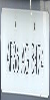

GV03CI5166


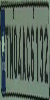

GV01HT2661


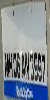

GV03II5160


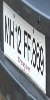

GV02CL9626


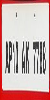

GV09WI7061


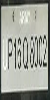

GV11IV3066


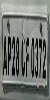

GV02QL9918


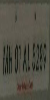

GV23BI8671


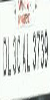

GV05IY5113


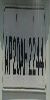

GV15QP5652


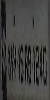

GV01WW9116


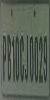

GV03HU2000


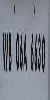

GV11MW2011


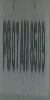

GV11WL2126


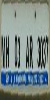

GV26IH2122


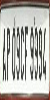

GV18QU6007


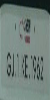

GV23ST4198


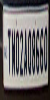

GV01LM1963


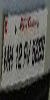

GV03EW9246


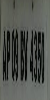

GV05HI2110


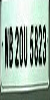

GV11NL7163


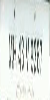

GV13IM7733


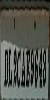

GV05WU9111


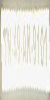

GV15IV7196


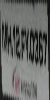

GV02WF4111


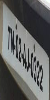

GV30QP5410


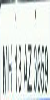

GV18PU9110


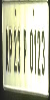

GV02QL2011


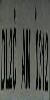

GV21WW2116


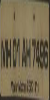

GV02QI3098


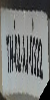

GV03RL1158


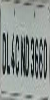

GV05IH1108


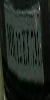

GV02NW9662


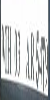

GV13DL4151


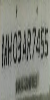

GV09AS9032


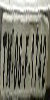

GV09JL2166


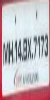

GV09MU5065


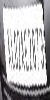

GV09BT9026


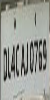

GV01IH9051


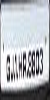

GV09WT8160


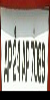

GV03UL6118


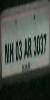

GV05MQ8646


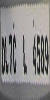

GV25UV5162


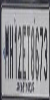

GV03BI2167


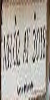

GV01LT9154


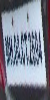

GV23WT2020


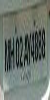

GV31DW9108


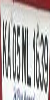

GV28TY5117


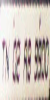

GV26FI1109


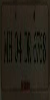

GV02WU8111


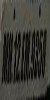

GV19WW2026


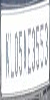

GV01OT2061


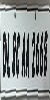

GV03UH6792


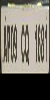

GV01NL8068


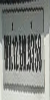

GV06FW9619


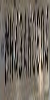

GV01HT9116


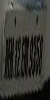

GV31DW9186


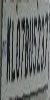

GV11MV2021


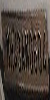

GV07WU9766


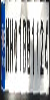

GV12QT2766


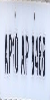

GV01OT2181


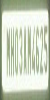

GV33QT8951


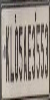

GV03BU4669


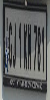

GV01MU2019


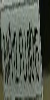

GV06DC9100


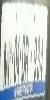

GV05JT9739


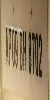

GV03QT7115


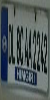

GV17UP9115


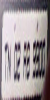

GV09DL1149


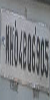

GV13DG5114


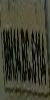

GV08QU9116


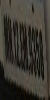

GV08QL9976


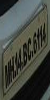

GV07MW2270


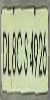

GV02UL9164


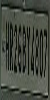

GV01QF2066


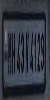

GV02QU2106


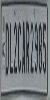

GV13HV2760


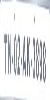

GV10NV2013


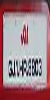

GV04UT9614


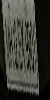

GV19MW2446


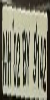

GV03HU8111


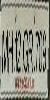

GV05GI9160


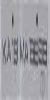

GV21IV2449


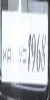

GV05QL1118


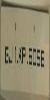

GV03DF9726


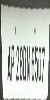

GV05WT9111


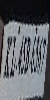

GV01HT9160


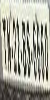

GV13HJ8166


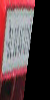

GV01JG6116


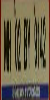

GV03QU9759


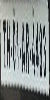

GV01WT1066


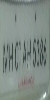

GV03QH9189


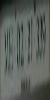

GV01MD8052


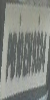

GV18WF7110


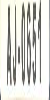

GV13HT9016


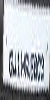

GV11BP5150


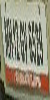

GV08VL1118


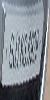

GV15QL4051


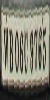

GV03NU2002


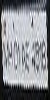

GV15OL2116


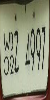

GV09QI9060


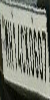

GV21WL8763


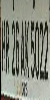

GV02DM1071


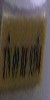

GV11IW9138


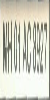

GV03DL1072


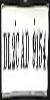

GV03QC6154


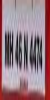

GV02ML8051


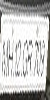

GV03IF1058


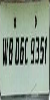

GV11DT9016


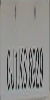

GV21II9100


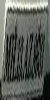

GV02WW2788


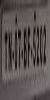

GV31EM5012


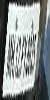

GV03IM9450


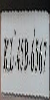

GV02QI9119


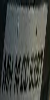

GV03JC9116


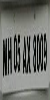

GV03DR5031


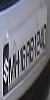

GV02FO9730


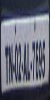

GV09WF1166


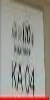

GV01AF4631


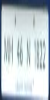

GV05NT4161


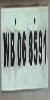

GV30WV2101


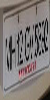

GV12ZJ9552


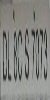

GV01HM6111


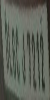

GV19HT7111


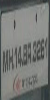

GV01UL9128


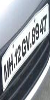

GV07SJ4227


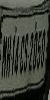

GV03IW9616


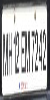

GV03WL1032


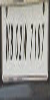

GV33QM1851


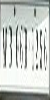

GV13UV5017


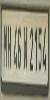

GV01WU2064


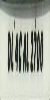

GV14IV2013


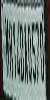

GV13WT9761


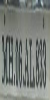

GV08IW8116


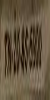

GV31GW2018


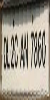

GV08BL9112


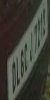

GV09JU2261


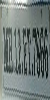

GV01DW6015


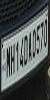

GV12JW9260


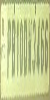

GV11HI7167


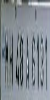

GV05HJ6161


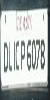

GV03QL9011


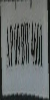

GV31IT4959


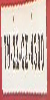

GV10WL9115


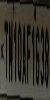

GV11IM5110


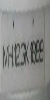

GV09FP9785


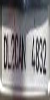

GV09QP5956


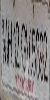

GV31WG9511


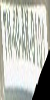

GV12MC7016


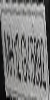

GV05PU9616


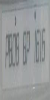

GV13GV5033


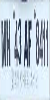

GV22LW1096


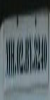

GV04II2099


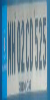

GV33MT1936


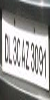

GV05UL2073


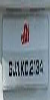

GV33PZ5475


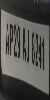

GV03MI4016


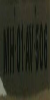

GV01WU9016


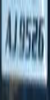

GV11MM8061


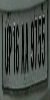

GV33WL9034


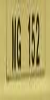

GV14QP5176


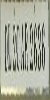

GV03OJ9042


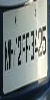

GV03QU9159


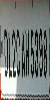

GV09RW2916


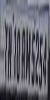

GV01QC2011


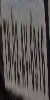

GV11WL2116


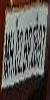

GV01FC9848


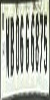

GV33HT2060


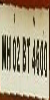

GV00ZU2155


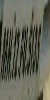

GV11UV5099


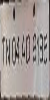

GV05HJ9196


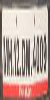

GV03ML2109


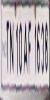

GV31DT9001


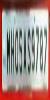

GV02QL2165


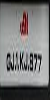

GV01BT6019


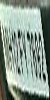

GV06IY9846


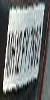

GV13IV2857


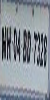

GV03HY5702


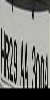

GV09DP8160


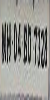

GV33UH2123


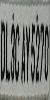

GV01WI4108


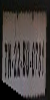

GV03RT9169


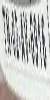

GV22UU1166


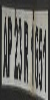

GV11WT2111


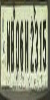

GV03QT9058


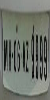

GV05DD9166


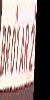

GV01NW2007


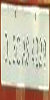

GV05QO9171


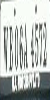

GV11MW2166


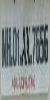

GV09HH7052


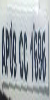

GV21GW2115


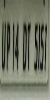

GV10KV9062


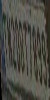

GV12JU2116


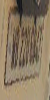

GV21LW9026


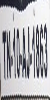

GV01UL7175


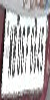

GV03IL9150


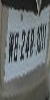

GV03WT5229


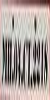

GV21DI8069


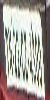

GV12DF2014


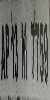

GV03QI6167


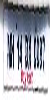

GV13IW7013


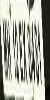

GV24WT9751


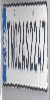

GV03ML2069


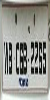

GV01QI1918


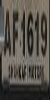

GV23HL8848


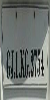

GV09QF6110


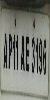

GV06QW2165


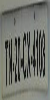

GV05II5113


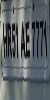

GV32QM9141


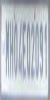

GV03MT4111


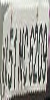

GV01MI9755


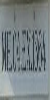

GV06NI2189


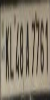

GV11HU6767


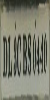

GV03RM2056


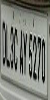

GV06DP5046


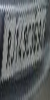

GV11IL9466


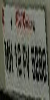

GV14IU9660


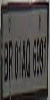

GV02IU9160


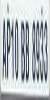

GV03MI6776


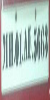

GV11KM9913


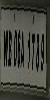

GV32WT2091


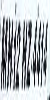

GV20HU5171


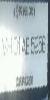

GV13IJ3126


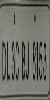

GV11DT5169


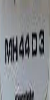

GV04UW9955


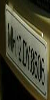

GV02MF6110


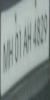

GV03IJ1822


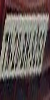

GV03OO9616


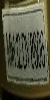

GV02UL1110


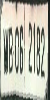

GV03HL4169


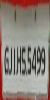

GV29WL8100


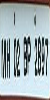

GV24UI1169


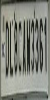

GV11QU2463


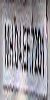

GV31QW8176


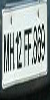

GV03NV1016


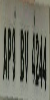

GV11HW2139


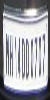

GV03DL1169


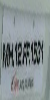

GV20FW7636


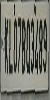

GV11HH2160


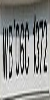

GV01HT2161


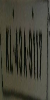

GV01NH8016


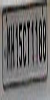

GV02BU9467


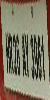

GV10WL6113


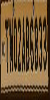

GV01DP9922


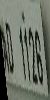

GV23WT9071


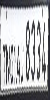

GV03NT4161


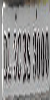

GV04UO9118


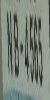

GV31NV7110


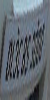

GV21FW4137


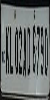

GV11BM9823


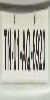

GV13QR2112


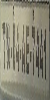

GV11WM9116


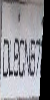

GV01JC9192


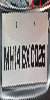

GV12RL9122


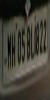

GV03IU9952


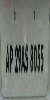

GV19II9176


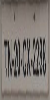

GV24RV2005


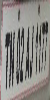

GV01DT6151


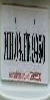

GV00IW3903


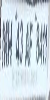

GV21FP1432


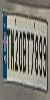

GV11IU9970


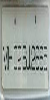

GV23PZ4231


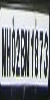

GV21NF5016


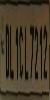

GV01HP2761


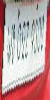

GV03UL9126


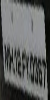

GV10JT9671


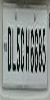

GV11BV2499


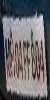

GV01HF8157


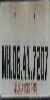

GV19II6176


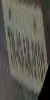

GV31QL2748


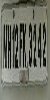

GV22WU5769


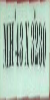

GV11MV2020


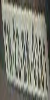

GV03NU2111


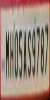

GV08HH5166


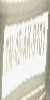

GV03AI3629


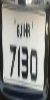

GV03JY1111


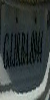

GV01NF4075


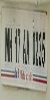

GV13CP2833


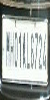

GV13JU4663


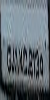

GV13WU6110


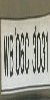

GV02UT2096


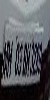

GV09RC9206


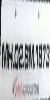

GV07JI9909


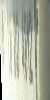

GV29MI1162


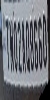

GV03UL2068


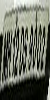

GV04MU9661


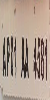

GV05IU7069


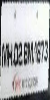

GV09UT9340


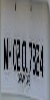

GV12II5170


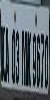

GV01WR1139


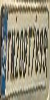

GV03DW2056


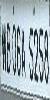

GV03UA8303


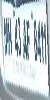

GV24VF8158


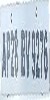

GV05HT2111


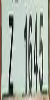

GV03HL1161


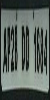

GV01HF2066


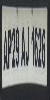

GV03KL4154


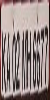

GV08UU9910


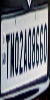

GV01AL1934


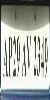

GV05OU2069


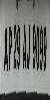

GV31QW2034


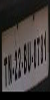

GV03QU1118


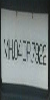

GV13JL8168


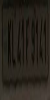

GV12IU9176


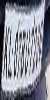

GV01PP9937


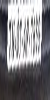

GV12AU8044


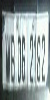

GV02WT8119


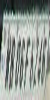

GV09QU9160


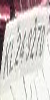

GV27IM9955


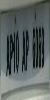

GV29KW2007


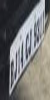

GV04PJ4258


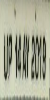

GV10QI2109


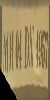

GV09NU2116


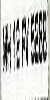

GV07MT2063


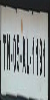

GV05QL9113


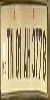

GV13MF4611


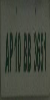

GV09MI2122


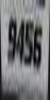

GV13WF1920


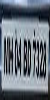

GV09DU2065


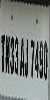

GV09QM2111


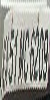

GV09FH9716


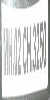

GV03NL3118


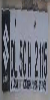

GV00JH5119


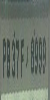

GV19MP2190


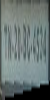

GV13NL7163


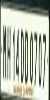

GV02WU2111


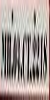

GV21NF5105


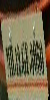

GV26QT3650


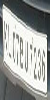

GV05AP2619


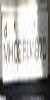

GV21JP4178


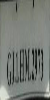

GV19QI9061


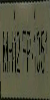

GV10IW2135


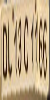

GV33MU2025


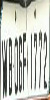

GV18DH8007


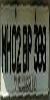

GV03XP4156


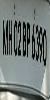

GV01UP5376


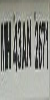

GV18MT8023


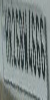

GV11HF2771


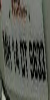

GV19IW9576


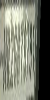

GV09HU8067


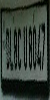

GV01WV9410


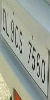

GV27CC3910


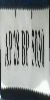

GV08IV9013


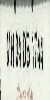

GV28KW2036


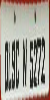

GV20QT9165


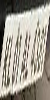

GV03IL9612


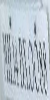

GV01JO8176


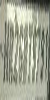

GV23QT8101


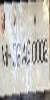

GV01JH1176


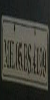

GV03ML9658


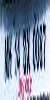

GV23FU3089


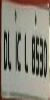

GV01CI9163


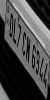

GV01SY5611


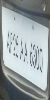

GV09LF4555


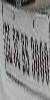

GV01CG6118


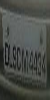

GV02QT8956


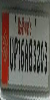

GV22QT9666


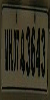

GV03WI8110


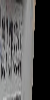

GV19HW7900


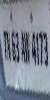

GV21UI1100


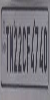

GV11QU2766


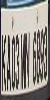

GV09KU3111


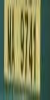

GV13HU9260


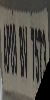

GV03NW6166


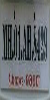

GV01IM9757


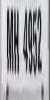

GV33HW9110


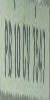

GV21HT2110


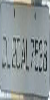

GV15QM7622


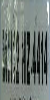

GV03DO9111


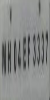

GV21JV9019


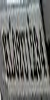

GV14RF9400


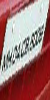

GV09II9116


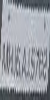

GV07BF5001


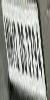

GV23WL9761


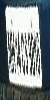

GV26DC2100


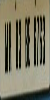

GV21HV2153


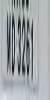

GV11OV2720


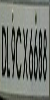

GV01MU2061


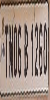

GV01MT6063


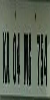

GV20PW2039


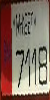

GV01DH7750


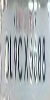

GV23II2111


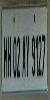

GV09BT6099


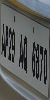

GV09VV7116


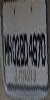

GV25UL1118


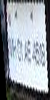

GV11AP3646


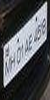

GV17JG2141


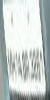

GV15JF9111


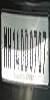

GV03HL5018


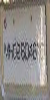

GV03LL1150


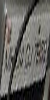

GV27WT4770


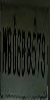

GV01HF9166


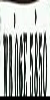

GV21DT9111


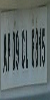

GV05QF6067


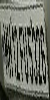

GV01AT9669


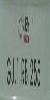

GV23EJ4128


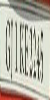

GV13IP5637


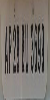

GV11LU2111


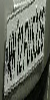

GV01CU9222


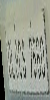

GV13DI5119


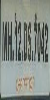

GV01DH2159


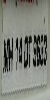

GV23IF8058


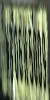

GV33BW9071


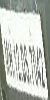

GV25JL8151


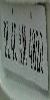

GV03WL9048


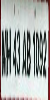

GV05QL7111


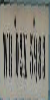

GV29WU2119


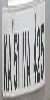

GV01WU7109


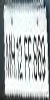

GV24HT4110


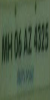

GV01IM5756


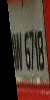

GV05DL8081


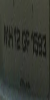

GV05IW3156


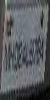

GV04JL9196


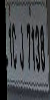

GV03MI8168


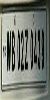

GV02DM2116


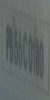

GV11II3111


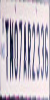

GV01MJ6712


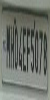

GV01ML7116


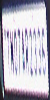

GV03QT4669


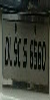

GV03OU2116


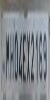

GV03DI6116


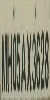

GV29OV9119


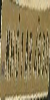

GV11LW9161


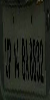

GV11WU9661


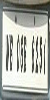

GV03QT5168


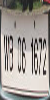

GV12FT4118


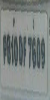

GV01IH2006


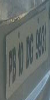

GV05FW7039


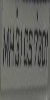

GV09II9427


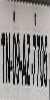

GV20DF8138


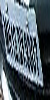

GV07RC6642


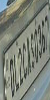

GV07PM2251


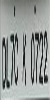

GV01IW2113


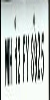

GV13BT8119


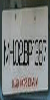

GV05UU9946


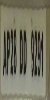

GV05QT2111


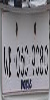

GV09IJ6243


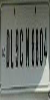

GV08HV2014


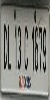

GV01UE9994


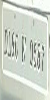

GV05TI9654


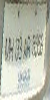

GV13UL1155


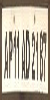

GV08NL7101


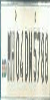

GV13UH2100


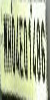

GV30HT8179


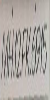

GV07NT9006


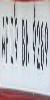

GV23DJ4024


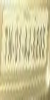

GV13UM4116


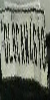

GV27KF9826


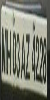

GV06QL9111


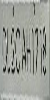

GV03DU5967


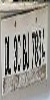

GV03CC1111


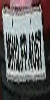

GV27NT8092


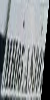

GV07JV6116


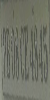

GV03IW2167


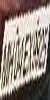

GV03WU9626


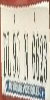

GV05LM9111


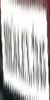

GV05QL2114


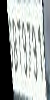

GV29UT7699


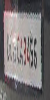

GV22II8766


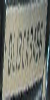

GV11BF9030


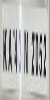

GV23MV2183


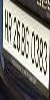

GV24QF2770


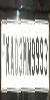

GV21MT2969


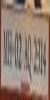

GV05QC2168


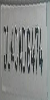

GV09IV2114


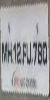

GV09JW9086


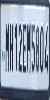

GV02QI9966


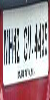

GV02QI8076


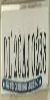

GV05SU5001


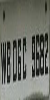

GV05QR6106


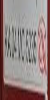

GV02QT9164


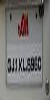

GV21DT5471


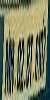

GV05WL8170


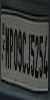

GV03WV2118


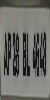

GV05KH4113


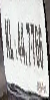

GV23UT4768


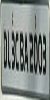

GV23WP6662


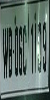

GV01DF5768


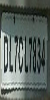

GV11DL2051


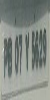

GV08WV2063


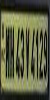

GV01WU2116


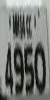

GV31NJ2114


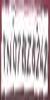

GV11II2812


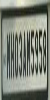

GV13BU5160


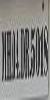

GV01WI2111


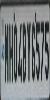

GV03HU2111


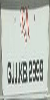

GV12QT6211


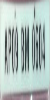

GV31UU2166


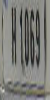

GV13MU1956


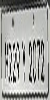

GV09BH5021


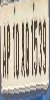

GV01QU8069


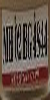

GV01IM9132


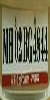

GV01LZ9235


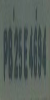

GV11HU5001


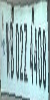

GV01WL6110


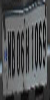

GV02MT2068


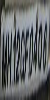

GV03WU9065


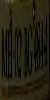

GV01WL9112


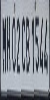

GV02RI2062


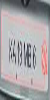

GV13UT7166


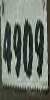

GV03DT8169


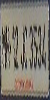

GV02CL1154


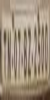

GV21DP8933


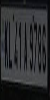

GV01QL9064


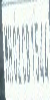

GV01II7119


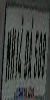

GV03WV5161


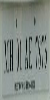

GV20FV9151


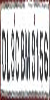

GV01DO1766


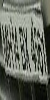

GV32WF8866


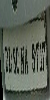

GV09DT9160


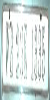

GV02NU1961


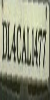

GV19MW8912


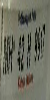

GV04LF9033


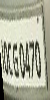

GV12IL8116


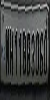

GV15MM2111


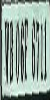

GV11BW6160


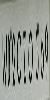

GV03II8116


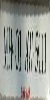

GV33PI2753


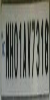

GV09DM6160


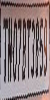

GV13JU2763


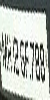

GV02JL9119


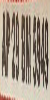

GV10RT5160


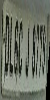

GV23HT3021


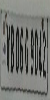

GV01DT2110


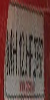

GV06HF9060


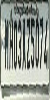

GV03DU9064


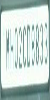

GV03NL1173


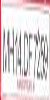

GV23AW6111


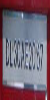

GV03JF9642


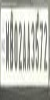

GV03HU2067


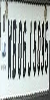

GV11HV2110


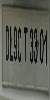

GV01UH2102


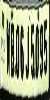

GV01DU2163


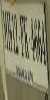

GV14MZ1426


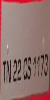

GV24JC6109


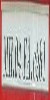

GV03QU6161


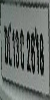

GV05WV1016


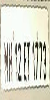

GV19BU1179


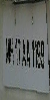

GV13WL2168


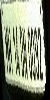

GV29WT9611


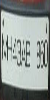

GV03OC9064


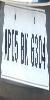

GV15QL2180


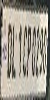

GV11IT7170


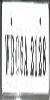

GV01JI6016


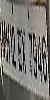

GV05IU9616


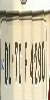

GV00QV2116


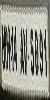

GV33QL2162


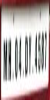

GV09OU2111


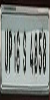

GV02QP2064


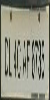

GV04JW1165


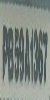

GV03HT2004


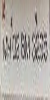

GV21HT7095


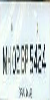

GV19DP9629


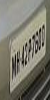

GV07JM6570


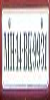

GV03GL3094


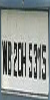

GV03QL6119


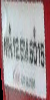

GV01IP2540


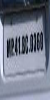

GV08AI1195


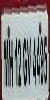

GV03DL9119


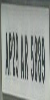

GV09IU2161


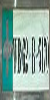

GV08QT9006


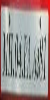

GV01NL2119


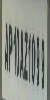

GV03DU2111


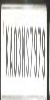

GV03HT2061


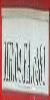

GV05QI6169


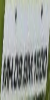

GV24WL9101


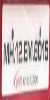

GV03JP2726


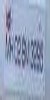

GV11RW2036


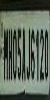

GV02IW5010


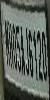

GV03JU9416


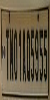

GV04HW5017


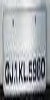

GV04GC8306


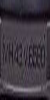

GV01NL8028


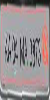

GV05PT1096


In [ ]:
# running the model on test dataset

char_labels = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P',
               'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

num_labels = ['0', '1', '2', '3', '4', '5','6', '7', '8', '9']

for k in image_list:
    k=cv2.resize(k,(50,100),interpolation = cv2.INTER_CUBIC)
    cv2_imshow(k)
    test = np.expand_dims(k, axis=0)
    pred = license_model.predict(test)
    plate = ''
    for i in range(10):
        if len(pred[i][0])<20:
            plate += num_labels[np.argmax(pred[i][0])]
        else:
            plate += char_labels[np.argmax(pred[i][0])]
    print(plate)

# we can see from the below results that even the degraded images have been captured properly with some inconsistencies between O and Q
# 1 and 7 when the images are very degraded.

In [ ]:
!unzip /content/drive/MyDrive/Forensics/license.zip -d /content/drive/MyDrive/Forensics/license 

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33AC2179.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33AE4559.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33AU6396.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33AU6681.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33AV1379.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33BE4966.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33BH7055.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33BL7233.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33BO3063.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33BQ3160.png  
  inflating: /content/drive/MyDrive/Forensics/license/license/train1/TN33BU2901.png  
  i